# Menggunakan DCGAN untuk Menghasilkan Gambar Paru Sintetis

* DCGAN diusulkan dalam [Pembelajaran Representasi Tanpa Pengawasan dengan Jaringan Adversarial Generatif Konvolusional Mendalam](https://arxiv.org/abs/1511.06434) oleh Radford, dkk.

Dalam buku catatan ini kita akan:

* Unduh gambar Xray paru-paru dari Hugging Face Hub
* Proses terlebih dahulu gambarnya
* Gunakan DCGAN untuk menghasilkan gambar sintetis
* Visualisasikan proses pelatihan

* Notebook demo ini telah diadaptasi dari [di sini](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-generasi/miniconda/dcgan-image-generasi/ notebook_chest_image_generasi_dcgan.ipynb) dan [di sini](https://github.com/huggingface/community-events/tree/main/huggan/pytorch/dcgan). Notebook berjalan selama beberapa jam menggunakan RAM Tinggi.

### Tentang Kumpulan Data

#### Ringkasan diambil dari [Mengidentifikasi Diagnosis Medis dan Penyakit yang Dapat Diobati dengan Deep Berbasis Gambar Pembelajaran](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867418301545%3Fshowall%3Dtrue ):

* Dataset disusun dalam 3 folder (train, test, val) dan berisi subfolder untuk setiap kategori gambar (Pneumonia/Normal). Terdapat 5.863 gambar X-Ray (JPEG) dan 2 kategori (Pneumonia/Normal).

* Gambar rontgen dada (anterior-posterior) dipilih dari kohort retrospektif pasien anak berusia satu hingga lima tahun dari Pusat Medis Wanita dan Anak Guangzhou, Guangzhou. Semua pencitraan rontgen dada dilakukan sebagai bagian dari perawatan klinis rutin pasien.

* Untuk analisis gambar rontgen dada, semua rontgen dada pada awalnya disaring untuk pengendalian kualitas dengan menghapus semua hasil pindaian berkualitas rendah atau tidak dapat dibaca. Diagnosis gambar tersebut kemudian dinilai oleh dua dokter ahli sebelum disetujui untuk pelatihan sistem AI. Untuk memperhitungkan kesalahan penilaian, set evaluasi juga diperiksa oleh ahli ketiga.

[Sumber Kumpulan Data](https://data.mendeley.com/datasets/rscbjbr9sj/2)

### First, we will install the dependencies

In [1]:
!pip install -q datasets huggingface_hub datasets torch torchvision accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


### Next, we will download the dataset from the Hugging Face Hub.

In [2]:
from datasets import load_dataset

# load the datset of lung images
dataset = load_dataset("hf-vision/chest-xray-pneumonia")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/2.06k [00:00<?, ?B/s]

train-00000-of-00007.parquet:   0%|          | 0.00/446M [00:00<?, ?B/s]

train-00001-of-00007.parquet:   0%|          | 0.00/385M [00:00<?, ?B/s]

train-00002-of-00007.parquet:   0%|          | 0.00/68.9M [00:00<?, ?B/s]

train-00003-of-00007.parquet:   0%|          | 0.00/74.1M [00:00<?, ?B/s]

train-00004-of-00007.parquet:   0%|          | 0.00/59.9M [00:00<?, ?B/s]

train-00005-of-00007.parquet:   0%|          | 0.00/57.6M [00:00<?, ?B/s]

train-00006-of-00007.parquet:   0%|          | 0.00/57.8M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/3.02M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/78.2M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5216 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/16 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/624 [00:00<?, ? examples/s]

### Before running a model, it is always a good idea to explore the dataset a little bit.

We will start by finding the length of the dataset.

In [3]:
len(dataset['train'])

5216

Let's visualize the first 4 images of the dataset, which are labeled as "normal."

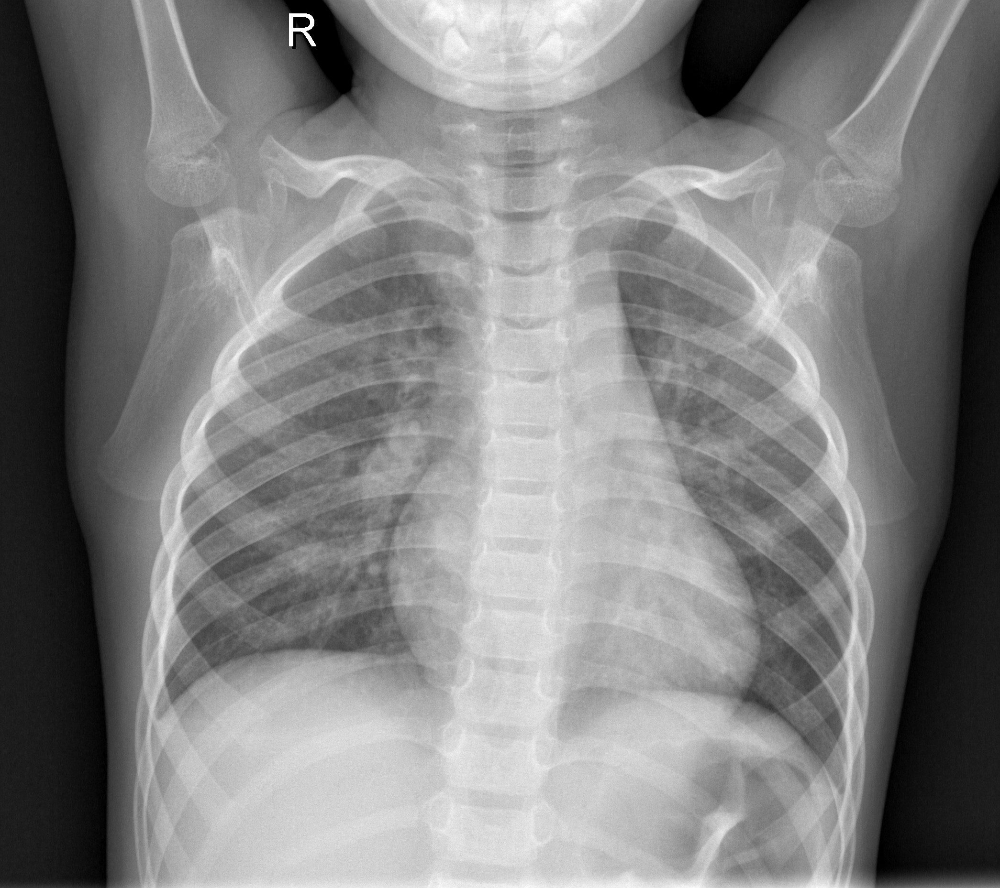

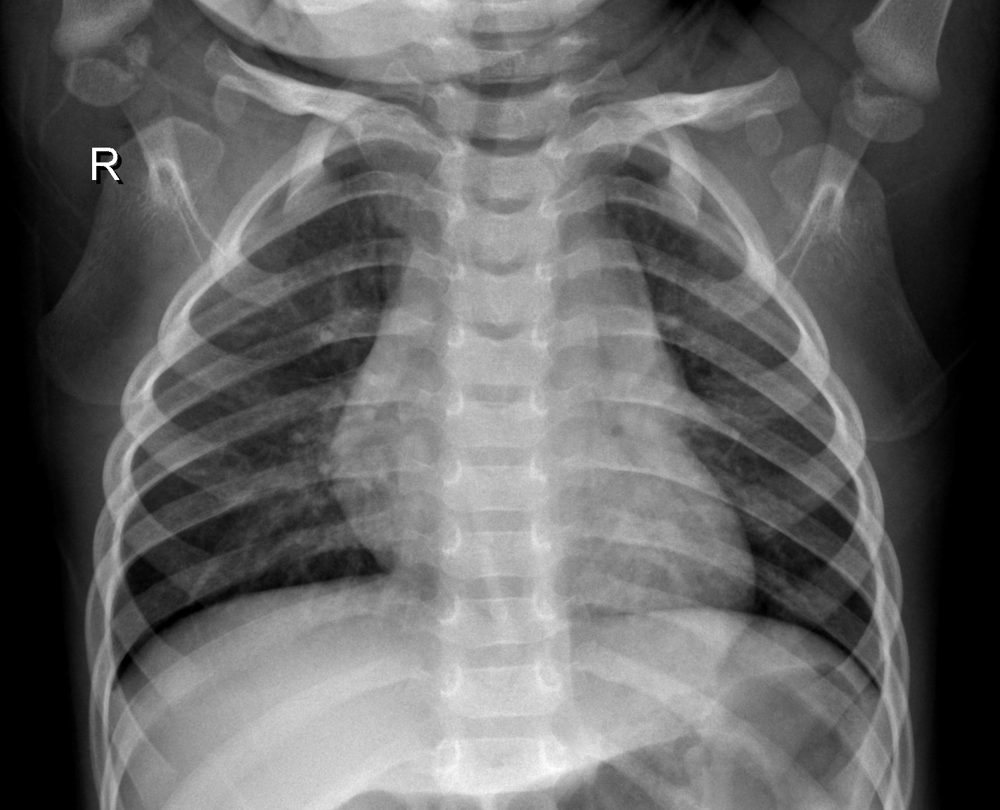

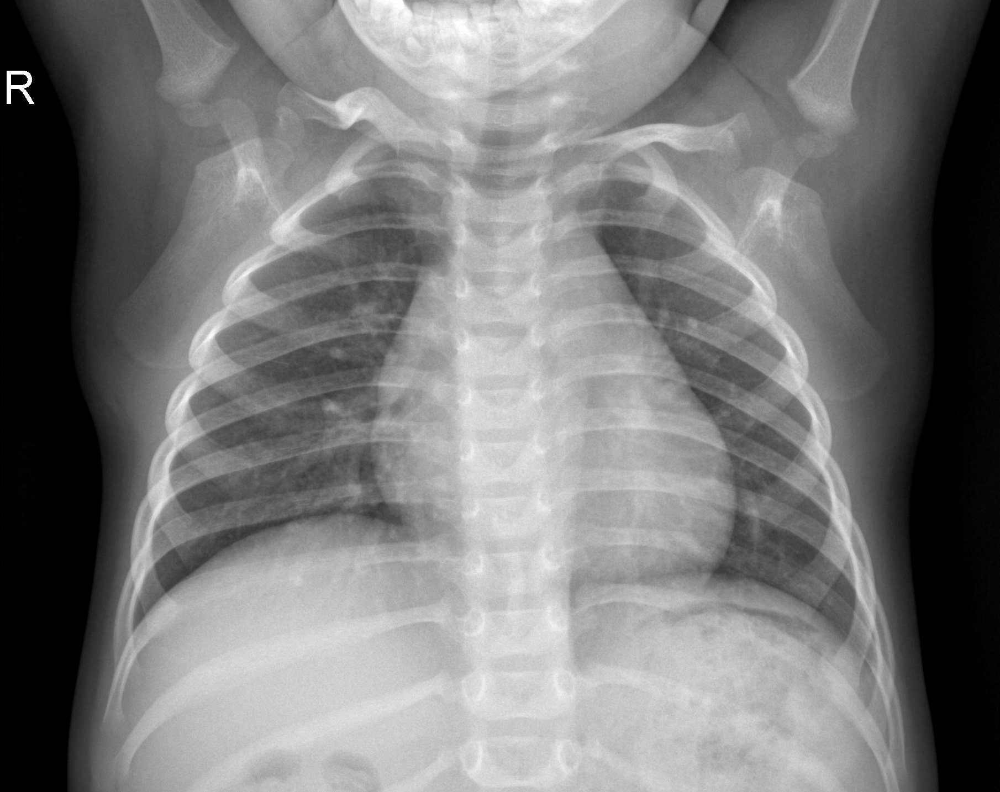

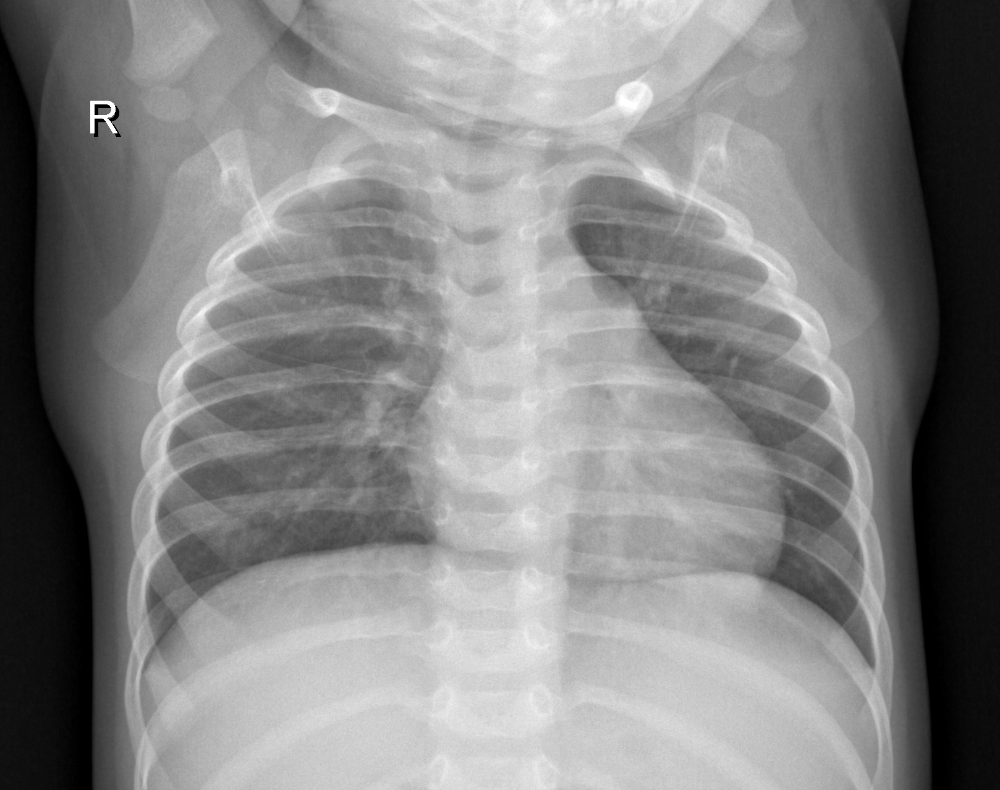

In [4]:
from PIL import Image
from IPython.display import display


# Display the image
for i in range(4):
     display(dataset["train"][i]['image'])

Now let's look at the last 4 images in the dataset, which are labeled "pneumonia."

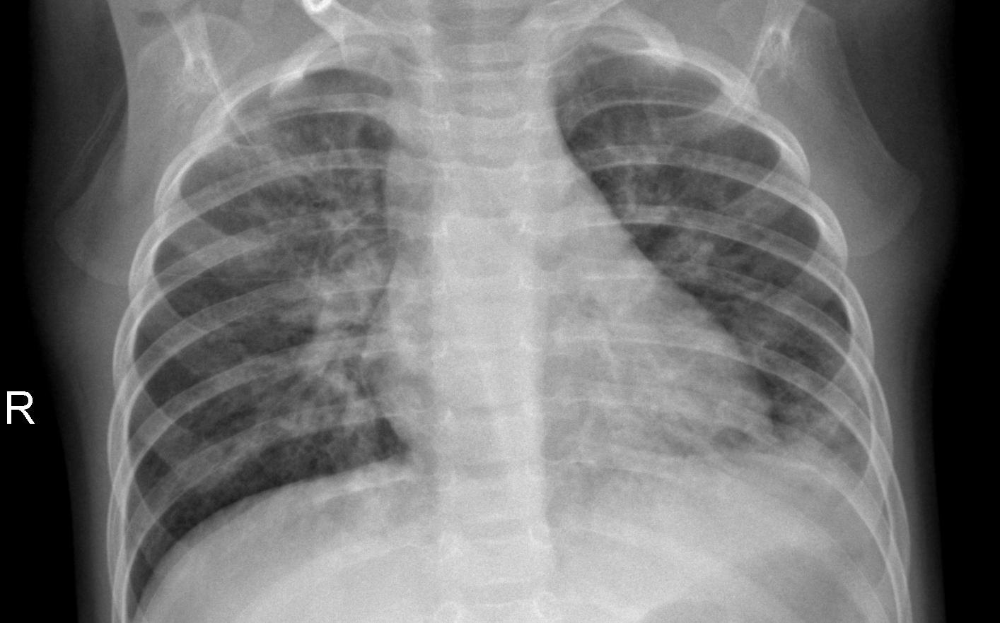

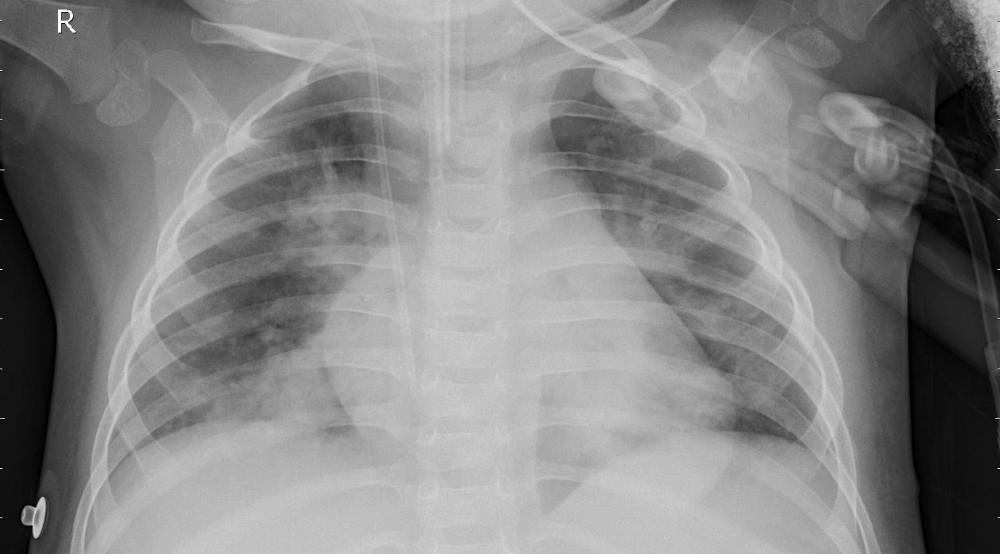

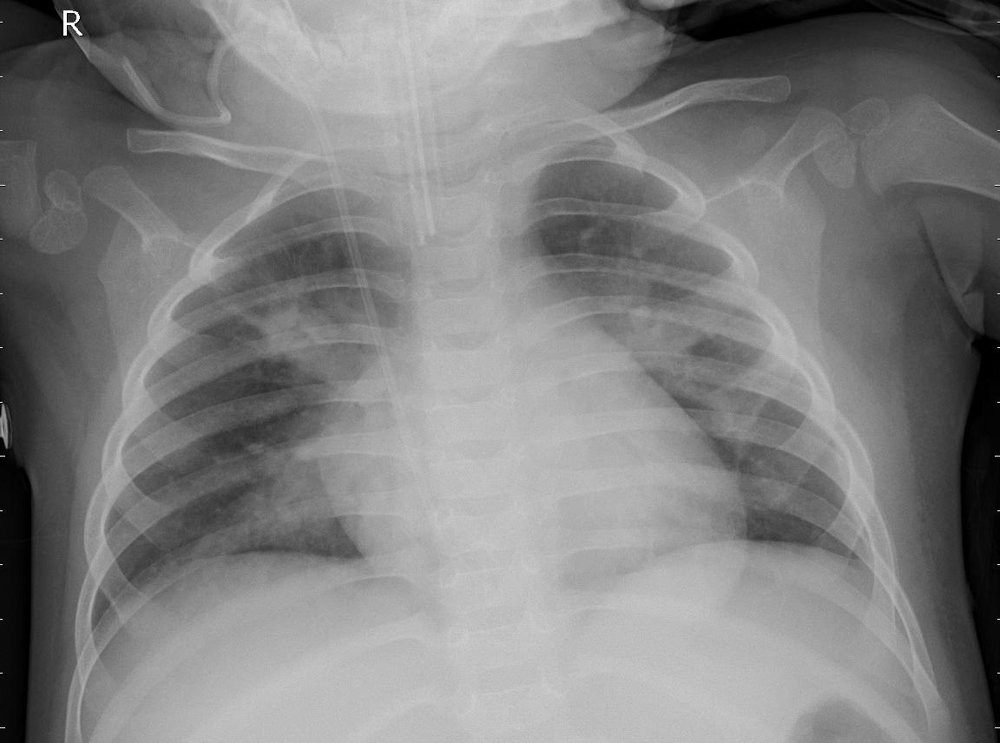

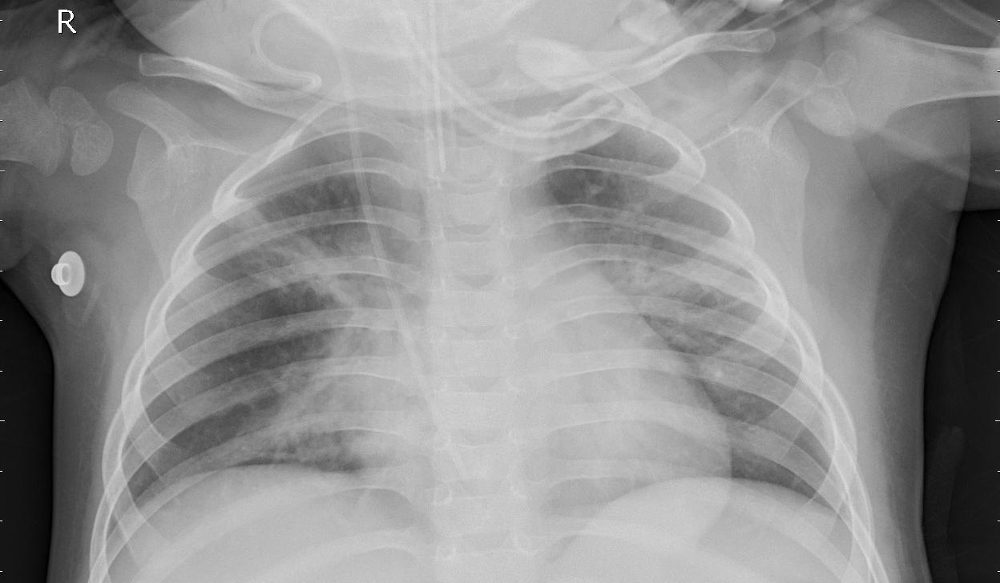

In [5]:
from PIL import Image
from IPython.display import display

# Display the image
for i in range(5211,5215):
     display(dataset["train"][i]['image'])


### We will import the necessary libraries

In [6]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import math
import numpy as np
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim

from PIL import Image
import torchvision.transforms as transforms
from torchvision.transforms import CenterCrop, Compose, Normalize, Resize, ToTensor
import torchvision.utils as vutils
from torch.utils.data import DataLoader

### Sekarang kita akan memproses data terlebih dahulu

* Kami akan menstandardisasi gambar menggunakan Resize dan CenterCrop.

* Kami akan mengubah gambar menjadi tensor.

* Kami akan menormalkan data:

  * Rata-rata (0,5, 0,5, 0,5) memastikan bahwa data gambar secara kasar berada di sekitar nol. Hal ini dapat membantu mencegah masalah terkait hilangnya atau meledaknya gradien selama pelatihan.
  * Standar deviasi ke (0,5, 0,5, 0,5), Anda menskalakan data masukan berada di kisaran [-1, 1]. Kisaran ini sering kali lebih disukai untuk jaringan generator di GAN

In [7]:
batch_size = 128
nb_gpu = 1
nb_workers = 2 # based on system resources

# GPU or CPU (Not having at least 1 GPU can prevent code from working)
device = torch.device("cuda:0" if (torch.cuda.is_available() and nb_gpu > 0) else "cpu")
n_channels = 3
image_size = 64
input_shape = (image_size, image_size)

# Set a seed for reproducibility
seed = 22
random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# define the transform
transform = Compose(
        [
            Resize(image_size),
            CenterCrop(image_size),
            ToTensor(),
            Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
)

# define function
def transforms(examples):
   examples["image"] = [transform(image.convert("RGB")) for image in examples["image"]]
   return examples

transformed_dataset = dataset.with_transform(transforms)

#create dataloader
dataloader = DataLoader(
     transformed_dataset["train"], batch_size=batch_size, shuffle=True, num_workers=nb_workers
)

real_batch = next(iter(dataloader))

## Now we will create the models

First, we define some parameters.

In [8]:
# Size of z latent vector (i.e. size of generator input), same size as described in the DCGAN paper
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers, same value as described in the DCGAN paper
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers, same value as described in the DCGAN paper
beta1 = 0.5

Bobot model diinisialisasi secara acak dari distribusi Normal dengan mean=0, stdev=0,02.
 Ini diterapkan pada setiap lapisan Generator dan Diskriminator.

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Define the Generator

In [10]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, nb_gpu):
        super(Generator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution

            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``

            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``

            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``

            nn.ConvTranspose2d(ngf, n_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nb_channels) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

### Create the Generator

In [11]:
# Create the generator
gen_net = Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    gen_net = nn.DataParallel(gen_net, list(range(nb_gpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
gen_net.apply(weights_init)

# Print the model
print(gen_net)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Define the Discriminator

In [12]:
class Discriminator(nn.Module):
    def __init__(self, nb_gpu):
        super(Discriminator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is ``(nb_channels) x 64 x 64``

            nn.Conv2d(n_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``

            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

### Create the Discriminator

In [13]:
# Create the Discriminator
disc_net = Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    disc_net = nn.DataParallel(disc_net, list(range(nb_gpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
disc_net.apply(weights_init)

# Print the model
print(disc_net)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


### Ada dua jenis kesalahan statistik:
* Tipe 1 - Positif Palsu
* Tipe 2 - Negatif Palsu


Dalam kasus kami, diskriminator dapat melakukan dua jenis kesalahan/kekeliruan.  Pertama, ia dapat memberi label pada gambar asli sebagai "palsu".   Kedua, mereka dapat memberi label gambar palsu sebagai “asli”.

In [14]:
# Real image and discriminator thinks it is real - Right decision
target = 1
output= 0.99

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# Real image and discriminator thinks it is fake - False decision
target = 1
output= 0.01

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# False image but discriminator thinks it is real - False decision
target = 0
output= 0.99

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

0.01005033585350145
4.605170185988091
4.605170185988091


### Kita akan menggunakan Binary Cross Entropy Loss sebagai fungsi kerugian kita.

* BCELoss mengukur perbedaan antara probabilitas yang diprediksi dan nilai target sebenarnya.

In [15]:
# Set real and fake label values (following GAN paper convention)
real_label = 1.
fake_label = 0.

# Define loss function
criterion = nn.BCELoss()

### We set up the optimizers using the parameters provided by the DCGAN paper

In [16]:
optimizerD = optim.Adam(disc_net.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(gen_net.parameters(), lr=lr, betas=(beta1, 0.999))

## Training

### We initialize with random noise.

In [17]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

### We will save the model checkpoints to some folders. You could also upload the model to the Hugging Face Hub.

In [18]:
# Flags - For each epoch
show_images = True
save_images = True
save_model = True

def save_dcgan(netG, netD, path_checkpoint):
    checkpoint = {"g_model_state_dict": gen_net.state_dict(),
                "d_model_state_dict": disc_net.state_dict(),
                }

    torch.save(checkpoint, path_checkpoint)

def makedir(new_dir):
  if not os.path.exists(new_dir):
    os.makedirs(new_dir)

# Create folders
makedir("images")
makedir("models")

### Mari membuat loop pelatihan

**Untuk setiap zaman:**

* Perbarui Diskriminator:
  * hapus gradien diskriminator
  * dapatkan sekumpulan gambar nyata dari kumpulan data
  * membuat tensor label nyata
  * meneruskan gambar nyata melalui diskriminator dan mendapatkan hasilnya
  * menghitung kerugian diskriminator pada data nyata
  * propagasi mundur gradien

* Perbarui Generatornya:
  * bersihkan gradien generator
  * isi tensor label dengan label asli (mencoba mengelabui diskriminator)
  * meneruskan data palsu yang dihasilkan melalui diskriminator
  * menghitung kerugian generator berdasarkan respon diskriminator
  * propagasi mundur gradien

* Perbarui parameter Generator dan Diskriminator berdasarkan gradien

* Cetak statistik pelatihan

* Simpan kerugian untuk merencanakan

Simpan modelnya

Epoch: 0/100 Batches: 0/41	Loss_D: 1.7082   Loss_G: 6.0006    D(x): 0.7329    D(G(z)): 0.6611 / 0.0049


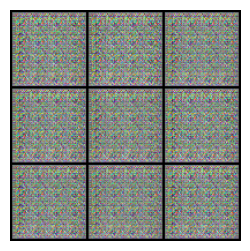

Epoch: 1/100 Batches: 0/41	Loss_D: 0.0008   Loss_G: 38.3410    D(x): 0.9992    D(G(z)): 0.0000 / 0.0000
Epoch: 2/100 Batches: 0/41	Loss_D: 0.0000   Loss_G: 37.8019    D(x): 1.0000    D(G(z)): 0.0000 / 0.0000
Epoch: 3/100 Batches: 0/41	Loss_D: 0.0000   Loss_G: 37.5704    D(x): 1.0000    D(G(z)): 0.0000 / 0.0000
Epoch: 4/100 Batches: 0/41	Loss_D: 0.0000   Loss_G: 37.2418    D(x): 1.0000    D(G(z)): 0.0000 / 0.0000
Epoch: 5/100 Batches: 0/41	Loss_D: 0.0001   Loss_G: 36.4841    D(x): 0.9999    D(G(z)): 0.0000 / 0.0000
Epoch: 6/100 Batches: 0/41	Loss_D: 0.0003   Loss_G: 38.5812    D(x): 0.9997    D(G(z)): 0.0000 / 0.0000
Epoch: 7/100 Batches: 0/41	Loss_D: 0.0000   Loss_G: 35.6678    D(x): 1.0000    D(G(z)): 0.0000 / 0.0000
Epoch: 8/100 Batches: 0/41	Loss_D: 1.3605   Loss_G: 9.3599    D(x): 0.8655    D(G(z)): 0.5718 / 0.0022
Epoch: 9/100 Batches: 0/41	Loss_D: 0.6073   Loss_G: 2.7101    D(x): 0.7339    D(G(z)): 0.1156 / 0.0970
Epoch: 10/100 Batches: 0/41	Loss_D: 0.8721   Loss_G: 2.8192    D(x

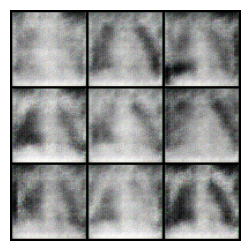

Epoch: 11/100 Batches: 0/41	Loss_D: 0.9911   Loss_G: 3.0498    D(x): 0.6493    D(G(z)): 0.3443 / 0.0917
Epoch: 12/100 Batches: 0/41	Loss_D: 0.6699   Loss_G: 2.5447    D(x): 0.7474    D(G(z)): 0.2615 / 0.1197
Epoch: 13/100 Batches: 0/41	Loss_D: 0.8697   Loss_G: 1.4566    D(x): 0.5565    D(G(z)): 0.1797 / 0.2552
Epoch: 14/100 Batches: 0/41	Loss_D: 1.0293   Loss_G: 1.3142    D(x): 0.4982    D(G(z)): 0.1614 / 0.3214
Epoch: 15/100 Batches: 0/41	Loss_D: 0.8508   Loss_G: 1.8161    D(x): 0.7855    D(G(z)): 0.3843 / 0.2245
Epoch: 16/100 Batches: 0/41	Loss_D: 0.7107   Loss_G: 2.9200    D(x): 0.6915    D(G(z)): 0.2190 / 0.0852
Epoch: 17/100 Batches: 0/41	Loss_D: 0.5489   Loss_G: 3.3923    D(x): 0.7979    D(G(z)): 0.2254 / 0.0698
Epoch: 18/100 Batches: 0/41	Loss_D: 1.3680   Loss_G: 6.3962    D(x): 0.9211    D(G(z)): 0.6624 / 0.0086
Epoch: 19/100 Batches: 0/41	Loss_D: 0.5675   Loss_G: 3.0396    D(x): 0.7567    D(G(z)): 0.1987 / 0.0690
Epoch: 20/100 Batches: 0/41	Loss_D: 0.9330   Loss_G: 3.2336    D

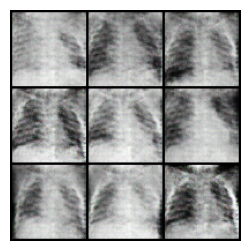

Epoch: 21/100 Batches: 0/41	Loss_D: 0.7750   Loss_G: 3.9168    D(x): 0.9067    D(G(z)): 0.4241 / 0.0335
Epoch: 22/100 Batches: 0/41	Loss_D: 1.6105   Loss_G: 1.8315    D(x): 0.3045    D(G(z)): 0.0330 / 0.2389
Epoch: 23/100 Batches: 0/41	Loss_D: 2.8738   Loss_G: 1.7370    D(x): 0.1289    D(G(z)): 0.0261 / 0.2655
Epoch: 24/100 Batches: 0/41	Loss_D: 1.5644   Loss_G: 2.0112    D(x): 0.3169    D(G(z)): 0.0293 / 0.2016
Epoch: 25/100 Batches: 0/41	Loss_D: 0.6467   Loss_G: 2.8181    D(x): 0.6466    D(G(z)): 0.0962 / 0.0837
Epoch: 26/100 Batches: 0/41	Loss_D: 0.4317   Loss_G: 3.9837    D(x): 0.8828    D(G(z)): 0.2299 / 0.0394
Epoch: 27/100 Batches: 0/41	Loss_D: 0.8766   Loss_G: 3.4953    D(x): 0.5022    D(G(z)): 0.0325 / 0.1029
Epoch: 28/100 Batches: 0/41	Loss_D: 0.5947   Loss_G: 3.8242    D(x): 0.8247    D(G(z)): 0.2786 / 0.0444
Epoch: 29/100 Batches: 0/41	Loss_D: 1.0075   Loss_G: 2.4603    D(x): 0.5204    D(G(z)): 0.1404 / 0.1280
Epoch: 30/100 Batches: 0/41	Loss_D: 0.6927   Loss_G: 5.6858    D

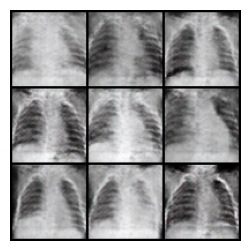

Epoch: 31/100 Batches: 0/41	Loss_D: 0.6582   Loss_G: 5.3414    D(x): 0.8815    D(G(z)): 0.3798 / 0.0152
Epoch: 32/100 Batches: 0/41	Loss_D: 0.7195   Loss_G: 4.8699    D(x): 0.8503    D(G(z)): 0.3891 / 0.0271
Epoch: 33/100 Batches: 0/41	Loss_D: 0.5106   Loss_G: 3.3575    D(x): 0.7521    D(G(z)): 0.1445 / 0.0586
Epoch: 34/100 Batches: 0/41	Loss_D: 0.5791   Loss_G: 4.2122    D(x): 0.8995    D(G(z)): 0.3335 / 0.0370
Epoch: 35/100 Batches: 0/41	Loss_D: 0.6543   Loss_G: 2.2968    D(x): 0.6225    D(G(z)): 0.0574 / 0.1254
Epoch: 36/100 Batches: 0/41	Loss_D: 0.8177   Loss_G: 2.7453    D(x): 0.5686    D(G(z)): 0.0525 / 0.1261
Epoch: 37/100 Batches: 0/41	Loss_D: 0.5041   Loss_G: 3.2171    D(x): 0.7279    D(G(z)): 0.1170 / 0.0627
Epoch: 38/100 Batches: 0/41	Loss_D: 0.5411   Loss_G: 3.2055    D(x): 0.7478    D(G(z)): 0.1555 / 0.0634
Epoch: 39/100 Batches: 0/41	Loss_D: 0.5733   Loss_G: 4.0830    D(x): 0.7659    D(G(z)): 0.2038 / 0.0490
Epoch: 40/100 Batches: 0/41	Loss_D: 0.4262   Loss_G: 4.1999    D

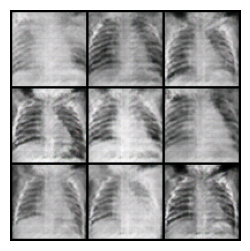

Epoch: 41/100 Batches: 0/41	Loss_D: 0.6168   Loss_G: 3.3138    D(x): 0.6636    D(G(z)): 0.0746 / 0.0857
Epoch: 42/100 Batches: 0/41	Loss_D: 0.6916   Loss_G: 6.4353    D(x): 0.8730    D(G(z)): 0.3803 / 0.0085
Epoch: 43/100 Batches: 0/41	Loss_D: 0.3803   Loss_G: 3.6807    D(x): 0.8403    D(G(z)): 0.1501 / 0.0379
Epoch: 44/100 Batches: 0/41	Loss_D: 0.4047   Loss_G: 5.8987    D(x): 0.9752    D(G(z)): 0.2824 / 0.0042
Epoch: 45/100 Batches: 0/41	Loss_D: 0.6001   Loss_G: 3.6718    D(x): 0.6733    D(G(z)): 0.1065 / 0.0547
Epoch: 46/100 Batches: 0/41	Loss_D: 0.6596   Loss_G: 4.0312    D(x): 0.7500    D(G(z)): 0.2353 / 0.0431
Epoch: 47/100 Batches: 0/41	Loss_D: 0.4515   Loss_G: 4.4319    D(x): 0.8648    D(G(z)): 0.2222 / 0.0187
Epoch: 48/100 Batches: 0/41	Loss_D: 0.3486   Loss_G: 4.5313    D(x): 0.8817    D(G(z)): 0.1775 / 0.0163
Epoch: 49/100 Batches: 0/41	Loss_D: 0.4930   Loss_G: 3.4207    D(x): 0.7178    D(G(z)): 0.0620 / 0.0778
Epoch: 50/100 Batches: 0/41	Loss_D: 0.2782   Loss_G: 4.1876    D

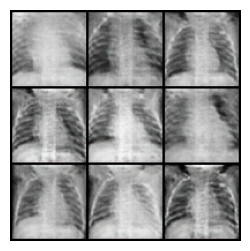

Epoch: 51/100 Batches: 0/41	Loss_D: 0.5318   Loss_G: 5.0855    D(x): 0.8665    D(G(z)): 0.2778 / 0.0127
Epoch: 52/100 Batches: 0/41	Loss_D: 0.6290   Loss_G: 6.2579    D(x): 0.9254    D(G(z)): 0.3842 / 0.0041
Epoch: 53/100 Batches: 0/41	Loss_D: 0.3382   Loss_G: 4.6310    D(x): 0.8828    D(G(z)): 0.1621 / 0.0192
Epoch: 54/100 Batches: 0/41	Loss_D: 0.3709   Loss_G: 3.7248    D(x): 0.8663    D(G(z)): 0.1698 / 0.0344
Epoch: 55/100 Batches: 0/41	Loss_D: 0.3234   Loss_G: 3.6801    D(x): 0.8061    D(G(z)): 0.0625 / 0.0680
Epoch: 56/100 Batches: 0/41	Loss_D: 0.6313   Loss_G: 8.1263    D(x): 0.9649    D(G(z)): 0.3810 / 0.0023
Epoch: 57/100 Batches: 0/41	Loss_D: 0.5893   Loss_G: 7.5541    D(x): 0.9648    D(G(z)): 0.3853 / 0.0030
Epoch: 58/100 Batches: 0/41	Loss_D: 0.5483   Loss_G: 7.0010    D(x): 0.8800    D(G(z)): 0.2745 / 0.0062
Epoch: 59/100 Batches: 0/41	Loss_D: 0.1770   Loss_G: 3.6865    D(x): 0.8962    D(G(z)): 0.0477 / 0.0528
Epoch: 60/100 Batches: 0/41	Loss_D: 0.2674   Loss_G: 3.9022    D

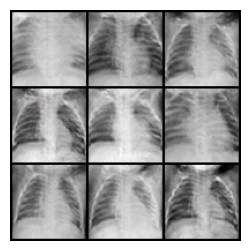

Epoch: 61/100 Batches: 0/41	Loss_D: 0.2910   Loss_G: 4.9119    D(x): 0.9119    D(G(z)): 0.1586 / 0.0135
Epoch: 62/100 Batches: 0/41	Loss_D: 0.4701   Loss_G: 4.5845    D(x): 0.6992    D(G(z)): 0.0085 / 0.0737
Epoch: 63/100 Batches: 0/41	Loss_D: 0.4381   Loss_G: 6.0775    D(x): 0.9158    D(G(z)): 0.2566 / 0.0067
Epoch: 64/100 Batches: 0/41	Loss_D: 0.5348   Loss_G: 2.5640    D(x): 0.6934    D(G(z)): 0.0304 / 0.1264
Epoch: 65/100 Batches: 0/41	Loss_D: 0.2017   Loss_G: 5.0371    D(x): 0.8793    D(G(z)): 0.0365 / 0.0143
Epoch: 66/100 Batches: 0/41	Loss_D: 0.1200   Loss_G: 3.2113    D(x): 0.9367    D(G(z)): 0.0450 / 0.0617
Epoch: 67/100 Batches: 0/41	Loss_D: 1.8831   Loss_G: 2.0774    D(x): 0.2914    D(G(z)): 0.0012 / 0.2663
Epoch: 68/100 Batches: 0/41	Loss_D: 0.2983   Loss_G: 5.6901    D(x): 0.9579    D(G(z)): 0.1961 / 0.0064
Epoch: 69/100 Batches: 0/41	Loss_D: 0.2968   Loss_G: 6.4641    D(x): 0.9519    D(G(z)): 0.1947 / 0.0030
Epoch: 70/100 Batches: 0/41	Loss_D: 0.3535   Loss_G: 4.2994    D

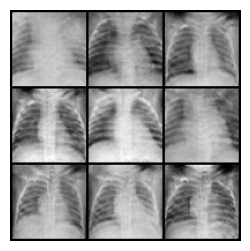

Epoch: 71/100 Batches: 0/41	Loss_D: 0.8455   Loss_G: 4.7810    D(x): 0.5912    D(G(z)): 0.0050 / 0.0312
Epoch: 72/100 Batches: 0/41	Loss_D: 0.8438   Loss_G: 8.3823    D(x): 0.8066    D(G(z)): 0.3303 / 0.0025
Epoch: 73/100 Batches: 0/41	Loss_D: 0.3047   Loss_G: 5.4518    D(x): 0.9560    D(G(z)): 0.2066 / 0.0077
Epoch: 74/100 Batches: 0/41	Loss_D: 0.2691   Loss_G: 5.0210    D(x): 0.9005    D(G(z)): 0.1238 / 0.0138
Epoch: 75/100 Batches: 0/41	Loss_D: 0.3297   Loss_G: 3.8732    D(x): 0.8657    D(G(z)): 0.1360 / 0.0392
Epoch: 76/100 Batches: 0/41	Loss_D: 0.2293   Loss_G: 3.7722    D(x): 0.8443    D(G(z)): 0.0142 / 0.0733
Epoch: 77/100 Batches: 0/41	Loss_D: 0.2314   Loss_G: 4.0465    D(x): 0.8898    D(G(z)): 0.0912 / 0.0312
Epoch: 78/100 Batches: 0/41	Loss_D: 0.3107   Loss_G: 4.3041    D(x): 0.8359    D(G(z)): 0.0699 / 0.0299
Epoch: 79/100 Batches: 0/41	Loss_D: 0.4792   Loss_G: 7.4737    D(x): 0.9498    D(G(z)): 0.2990 / 0.0012
Epoch: 80/100 Batches: 0/41	Loss_D: 0.7825   Loss_G: 11.6959    

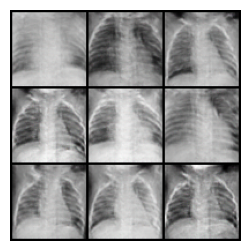

Epoch: 81/100 Batches: 0/41	Loss_D: 0.1300   Loss_G: 5.6036    D(x): 0.9592    D(G(z)): 0.0783 / 0.0088
Epoch: 82/100 Batches: 0/41	Loss_D: 0.3295   Loss_G: 5.1986    D(x): 0.9087    D(G(z)): 0.1718 / 0.0146
Epoch: 83/100 Batches: 0/41	Loss_D: 0.5559   Loss_G: 8.3827    D(x): 0.9812    D(G(z)): 0.3391 / 0.0008
Epoch: 84/100 Batches: 0/41	Loss_D: 0.3686   Loss_G: 3.3655    D(x): 0.7606    D(G(z)): 0.0251 / 0.0565
Epoch: 85/100 Batches: 0/41	Loss_D: 0.2084   Loss_G: 4.9672    D(x): 0.8497    D(G(z)): 0.0116 / 0.0135
Epoch: 86/100 Batches: 0/41	Loss_D: 0.3038   Loss_G: 5.4950    D(x): 0.9057    D(G(z)): 0.1598 / 0.0081
Epoch: 87/100 Batches: 0/41	Loss_D: 0.1304   Loss_G: 4.8840    D(x): 0.9359    D(G(z)): 0.0507 / 0.0153
Epoch: 88/100 Batches: 0/41	Loss_D: 0.1681   Loss_G: 4.8975    D(x): 0.9676    D(G(z)): 0.1148 / 0.0147
Epoch: 89/100 Batches: 0/41	Loss_D: 0.3123   Loss_G: 5.2607    D(x): 0.9050    D(G(z)): 0.1562 / 0.0123
Epoch: 90/100 Batches: 0/41	Loss_D: 0.2011   Loss_G: 3.7200    D

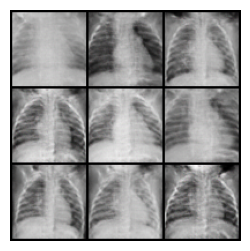

Epoch: 91/100 Batches: 0/41	Loss_D: 0.3066   Loss_G: 4.3639    D(x): 0.8903    D(G(z)): 0.1302 / 0.0218
Epoch: 92/100 Batches: 0/41	Loss_D: 0.2336   Loss_G: 4.8755    D(x): 0.9259    D(G(z)): 0.1216 / 0.0123
Epoch: 93/100 Batches: 0/41	Loss_D: 0.2429   Loss_G: 4.1097    D(x): 0.8588    D(G(z)): 0.0449 / 0.0398
Epoch: 94/100 Batches: 0/41	Loss_D: 1.4805   Loss_G: 3.1981    D(x): 0.4254    D(G(z)): 0.0099 / 0.1275
Epoch: 95/100 Batches: 0/41	Loss_D: 0.1137   Loss_G: 5.7531    D(x): 0.9472    D(G(z)): 0.0402 / 0.0079
Epoch: 96/100 Batches: 0/41	Loss_D: 0.1485   Loss_G: 5.4351    D(x): 0.9319    D(G(z)): 0.0624 / 0.0095
Epoch: 97/100 Batches: 0/41	Loss_D: 0.1235   Loss_G: 5.9602    D(x): 0.9225    D(G(z)): 0.0312 / 0.0067
Epoch: 98/100 Batches: 0/41	Loss_D: 0.1797   Loss_G: 3.9302    D(x): 0.8788    D(G(z)): 0.0308 / 0.0305
Epoch: 99/100 Batches: 0/41	Loss_D: 0.1896   Loss_G: 6.0667    D(x): 0.9674    D(G(z)): 0.1281 / 0.0044


In [19]:
# Load 9 images
nb_images = 9
nb_row = math.ceil(math.sqrt(nb_images))

# Training Loop
data_len = len(dataloader)

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []


# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader (depends on batch_size and your number of images)
    for i, data in enumerate(dataloader, 0):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

        ## Train with all-real batch
        disc_net.zero_grad()
        # Format batch
        real_cpu = data['image'].to(device)
        #real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = disc_net(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = gen_net(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = disc_net(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        gen_net.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = disc_net(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # (3) Metrics & Evaluation

        # Print output training stats every 50 batches (if your dataset is large, printing at every epoch might be less frequent than you want)
        if i % 50 == 0:
            print(f"Epoch: {epoch}/{num_epochs} Batches: {i}/{data_len}\tLoss_D: {errD.item():.4f}   Loss_G: {errG.item():.4f}    D(x): {D_x:.4f}    D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

    # Generate fake images to see how the generator is doing by saving G's output on fixed_noise at each epoch (fixed noise allow to obtain similar images).
    if show_images == True and epoch % 10 == 0:
        with torch.no_grad():
            # Uncomment the line below to generate a new variety of images every time
            #fixed_noise = torch.randn(64, nz, 1, 1, device=device)

            fake = gen_net(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake[:nb_images], padding=2, normalize=True, nrow=nb_row))

            plt.figure(figsize=(3, 3))
            plt.axis("off")
            plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))

            if save_images == True:
                plt.savefig(f'images/epoch_{epoch}_gen_images.png')

            # Display image
            plt.show()

    # Save models each 5 epochs
    if epoch % 5 == 0:
        if save_model:
            save_dcgan(gen_net, disc_net, path_checkpoint=f"models/chest_epoch_{epoch}_checkpoint.pkl")

# Save the final models
save_dcgan(gen_net, disc_net, path_checkpoint="models/chest_final_epoch_checkpoint.pkl")

## Let's look at a plot of the losses

We can see that the Generator loss starts very high, as it is initalized with random noise.  Conversely, the Discriminator loss is comparatively low since the images are random noise and obviously fake. As the Generator improves, it's loss decreases as it becomes harder for the Discriminator to distinquish between real and fake images (and conversely the Discriminator loss increases). During training, the Generator and Discriminator continue this adversarial process, and we see that the losses eventually stablize and fluctuate as one or the other improves.  

Ideally, we would like the model to achieve a balance where the Generator is producing high-quality images that are challenging for the Discriminator, resulting in both low Generator and Discriminator losses.


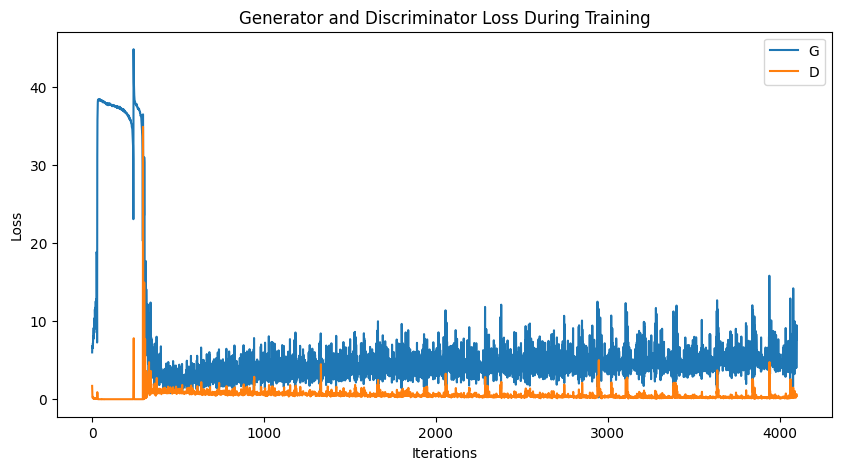

In [20]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### We will create an animation to visualize the training.

In [21]:
# increase the default limit set by Matplotlib for embedding animations
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100  # 100 MB

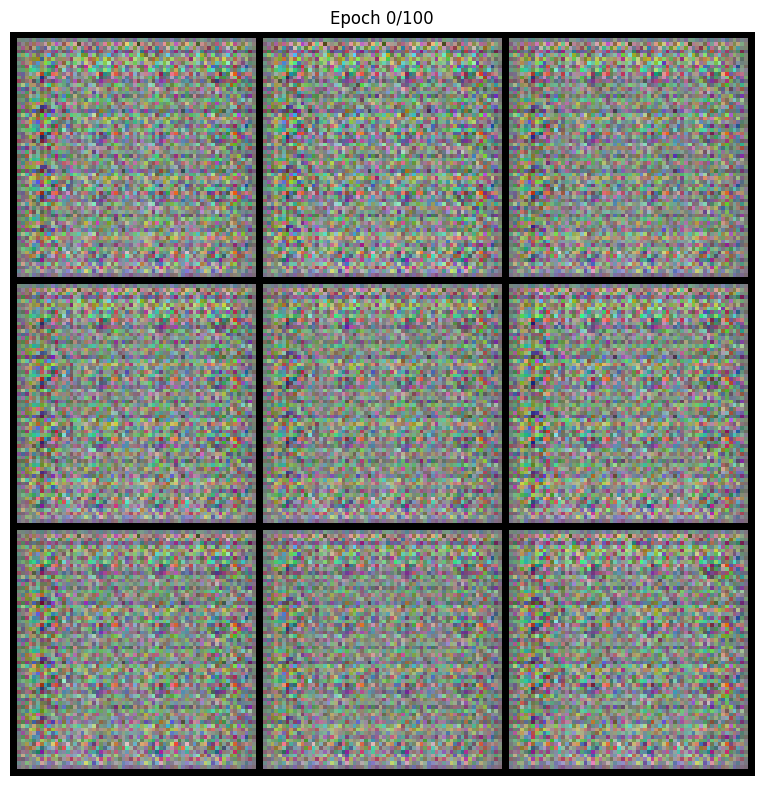

In [22]:
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
plt.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)

# Initial empty title and image
title = plt.title("")
img_plot = plt.imshow(np.transpose(img_list[0], (1, 2, 0)), animated=True)

def update_title_and_image(frame):
    img_plot.set_array(np.transpose(img_list[frame], (1, 2, 0)))
    title.set_text(f"Epoch {frame}/{num_epochs}")

ani = animation.FuncAnimation(fig, update_title_and_image, frames=len(img_list), interval=100, repeat_delay=5000)

# Display animation
HTML(ani.to_jshtml())

In [23]:
# Save the animation as a GIF
ani.save('images/dcgan_training_animation.gif', writer='pillow')

### Let's use our model to create some synthetic lung images.

In [24]:
# Specify desired weights path
path_checkpoint = "models/chest_final_epoch_checkpoint.pkl"

<ipython-input-25-31883b1e2340>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path_checkpoint, map_location="cpu")


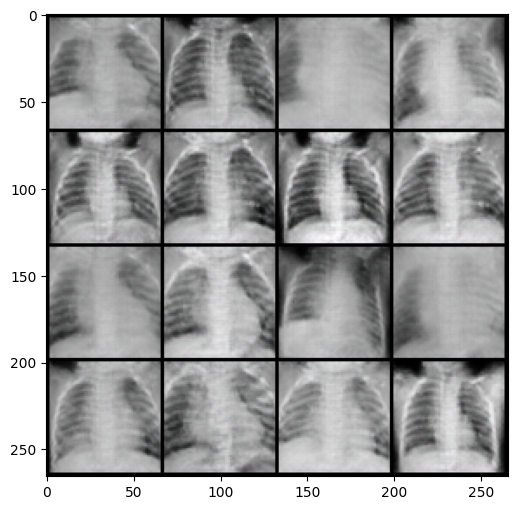

In [25]:
# Number of desired images
num_img = 16
nb_row = math.ceil(math.sqrt(num_img))

# Create a random noise
random_noise = torch.randn(num_img, nz, 1, 1, device=device)

# Instantiate a generator
new_gen= Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_gen = nn.DataParallel(new_gen, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_g = checkpoint["g_model_state_dict"]
new_gen.load_state_dict(state_dict_g)

# Generate images
with torch.no_grad():
    fake_data = new_gen(random_noise).detach().cpu()

# Plot images
img_grid = vutils.make_grid(fake_data, padding=2, normalize=True, nrow=nb_row).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()

Next, we will instantiate a new Discrminator from our saved model.

In [26]:
# Instantiate a discriminator
new_dis= Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_dis = nn.DataParallel(new_dis, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_d = checkpoint["d_model_state_dict"]
new_dis.load_state_dict(state_dict_d)

<ipython-input-26-5b47432402f4>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path_checkpoint, map_location="cpu")


<All keys matched successfully>

Kami akan menggunakan generator baru kami untuk membuat beberapa gambar paru-paru sintetis. Diskriminator baru akan memberi kita kemungkinan bahwa gambar paru-paru sintetis itu nyata.  Jika probabilitasnya lebih besar dari ambang batas (dalam kasus kami 70%), kami akan menambahkannya ke array gambar yang "bagus".  

Kita dapat melihat bahwa beberapa gambar yang "bagus" buram.  Hal ini menyoroti mengapa sangat penting untuk meminta ahli radiologi mengevaluasi gambar paru-paru sintetis!

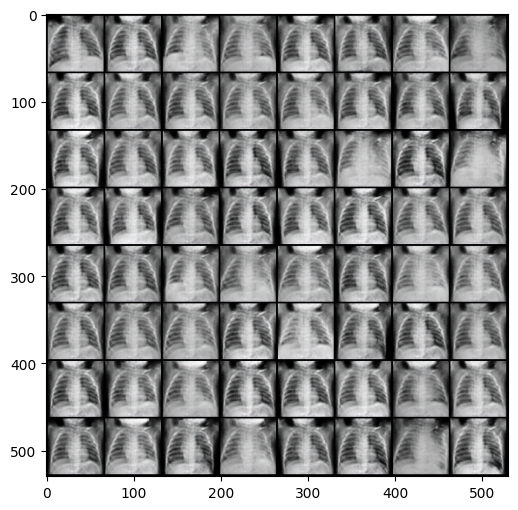

In [27]:
# Set threshold
threshold = 0.70


# Create list to store the images classified as >= threshold
pass_threshold = []

while len(pass_threshold)<64:
    # Create a random noise
    random_noise = torch.randn(num_img, nz, 1, 1, device=device)
    # Generate images for this noise
    with torch.no_grad():
        fake_data = new_gen(random_noise)

        # Set the discriminator to eval mode
        new_dis.eval()

        # Pass the generated fake_data through the discriminator & obtain real/fake probabilities
        output_probabilities = new_dis(fake_data)

    # Create mask (If prob < threshold, set to False, else True)
    good_image_mask = output_probabilities >= threshold

    # Remove extra tensor dims (torch.Size([16, 1, 1, 1]) -> torch.Size([16]))
    good_image_mask = good_image_mask.squeeze()

    # Keep the selected images
    good_images = fake_data[good_image_mask > threshold]

    # If good_images is not None
    if good_images.numel() > 0:
        # Loop through the tensor along the first dimension (index 0), since we have x images in a torch.Size([x, 3, 64, 64]) object
        for i in range(good_images.size(0)):
            # Add selected images
            pass_threshold.append(good_images[i])

# Plot selected images
img_grid = vutils.make_grid(pass_threshold, padding=2, normalize=True, nrow=8).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()

**Citation:**

Kermany, Daniel; Zhang, Kang; Goldbaum, Michael (2018), “Labeled Optical Coherence Tomography (OCT) and Chest X-Ray Images for Classification”, Mendeley Data, V2, doi: 10.17632/rscbjbr9sj.2
